In [52]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory



# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [53]:
train = pd.read_csv('./train.csv')
test = pd.read_csv('./test.csv')

In [3]:
#train_zeta = train.loc[train['target'] == 'Zeta Draconis']
#train_zeta

In [4]:
#train_gamma = train.loc[train['target'] == 'Gamma Saggita']
#train_gamma

In [5]:
#train_alpha = train.loc[train['target'] == 'Alpha Boreas']
#train_alpha

In [6]:
#train_beta = train.loc[train['target'] == 'Beta Eioneous']
#train_beta

In [54]:
df = train.groupby('target').apply(lambda x: x.fillna(x.mode().iloc[0]))
df

,radio_frequency,B_field,capture_rad,ang_class,dist_from_obs_ly,star1_redshift,luminosity,star2_redshift,ext_temp,b_class,target
0,28.744706,3.590000e-09,19.592496,alpha,41.986773,23.994950,6237.993588,34.939900,25.511543,3.0,Alpha Boreas
1,44.166331,4.510000e-09,43.004674,alpha,28.397134,28.943042,4230.266381,28.181097,26.047880,2.0,Alpha Boreas
2,30.834897,4.410000e-09,33.429970,alpha,17.152234,37.999181,6237.993588,29.577628,30.748244,2.0,Beta Eioneous
3,17.479827,3.540000e-09,12.976150,alpha,41.986773,17.683204,6237.993588,40.623018,29.488469,3.0,Zeta Draconis
4,30.268452,3.800000e-09,26.458232,alpha,11.548628,21.498649,6237.993588,25.976439,27.169169,2.0,Zeta Draconis
...,...,...,...,...,...,...,...,...,...,...,...
1995,41.551013,4.420000e-09,33.146966,alpha,24.282921,21.694687,2818.571131,22.299077,33.492452,2.0,Gamma Saggita
1996,31.104158,3.000000e-09,43.004674,alpha,16.859181,31.464783,4178.867596,22.679037,24.569472,2.0,Alpha Boreas
1997,44.166331,4.450000e-09,18.849264,alpha,18.108120,40.557671,4528.968755,40.623018,22.913804,2.0,Alpha Boreas
1998,37.997708,3.640000e-09,20.748943,alpha,39.666448,41.473909,3832.446538,19.432455,25.480769,3.0,Beta Eioneous


In [55]:
del df["ang_class"]

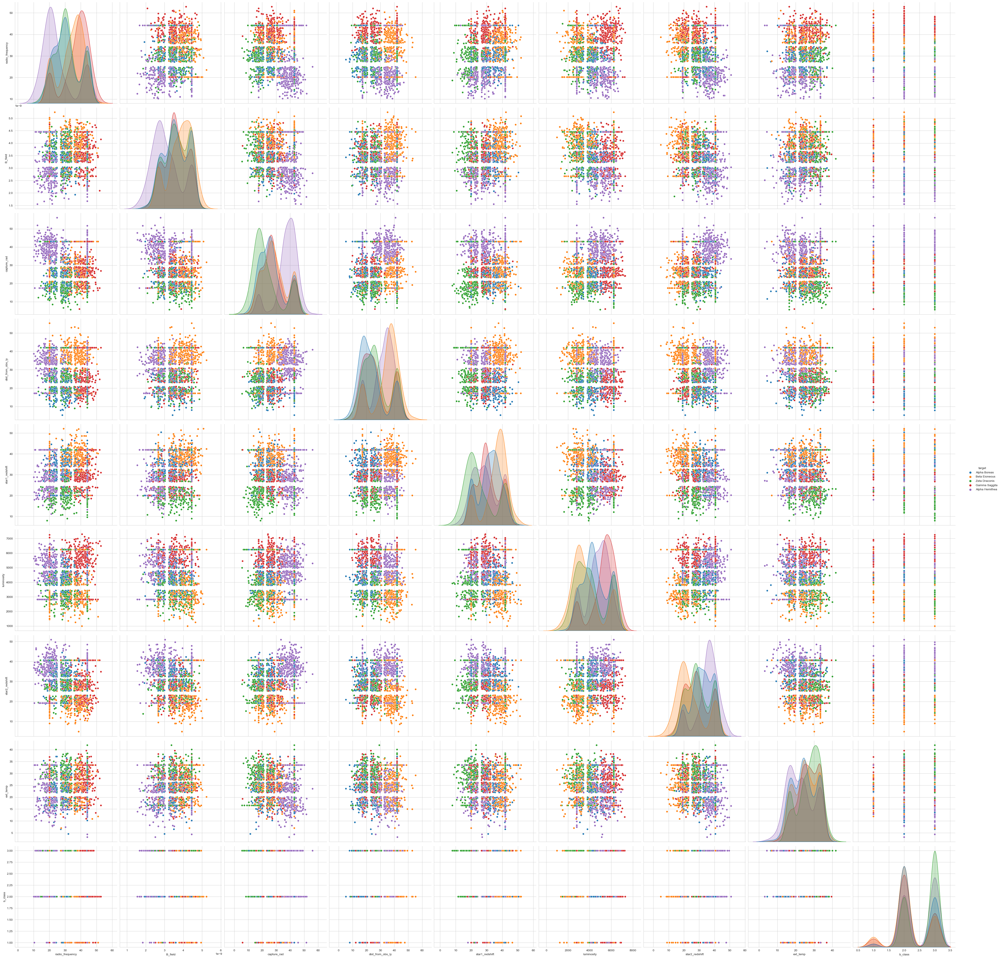

In [21]:
sns.set_style("whitegrid");
sns.pairplot(df, hue="target", height=5);
plt.show()

TypeError: Horizontal orientation requires numeric `x` variable.

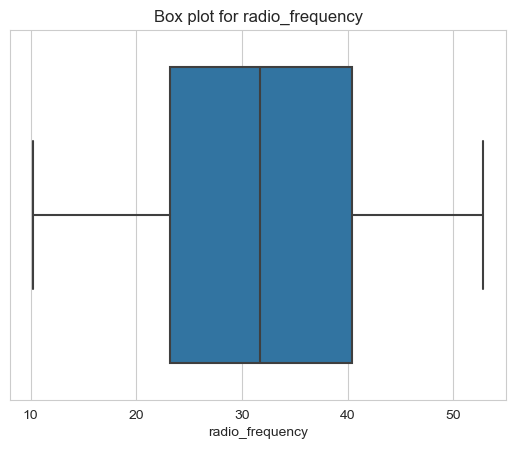

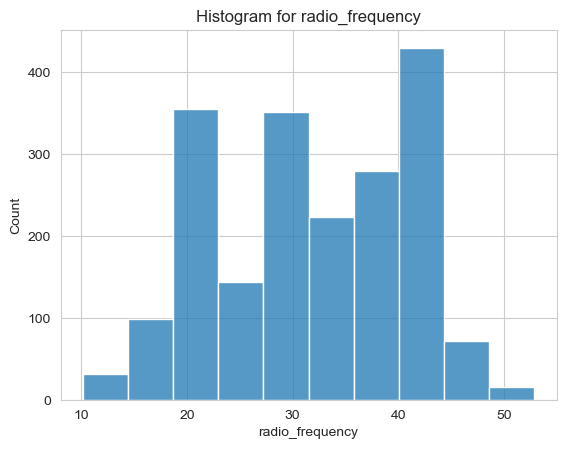

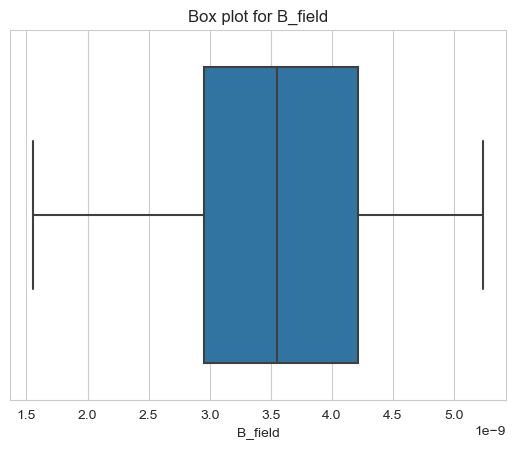

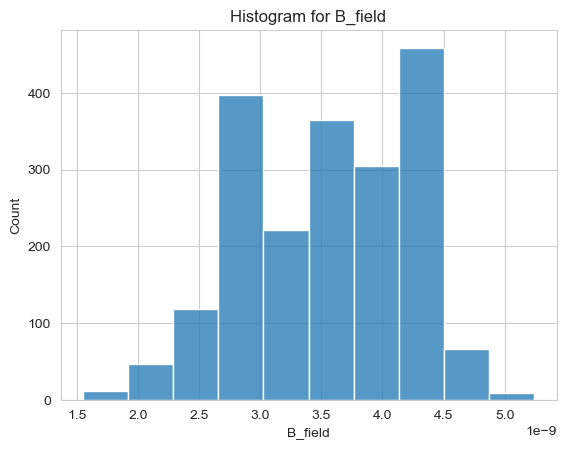

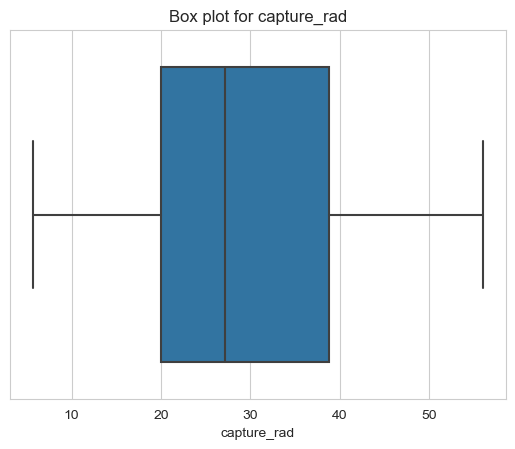

...

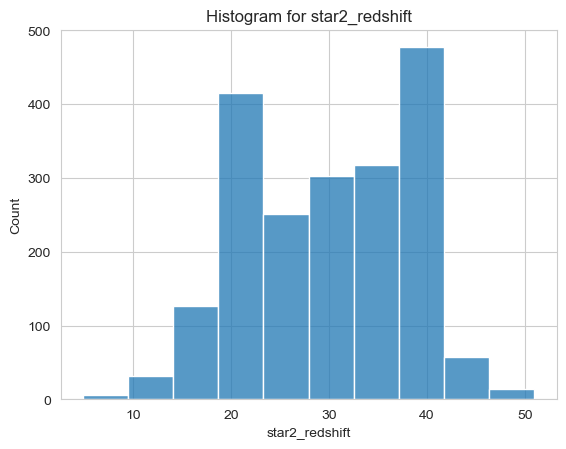

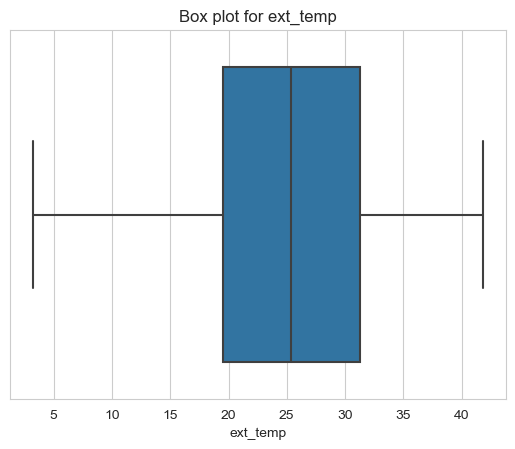

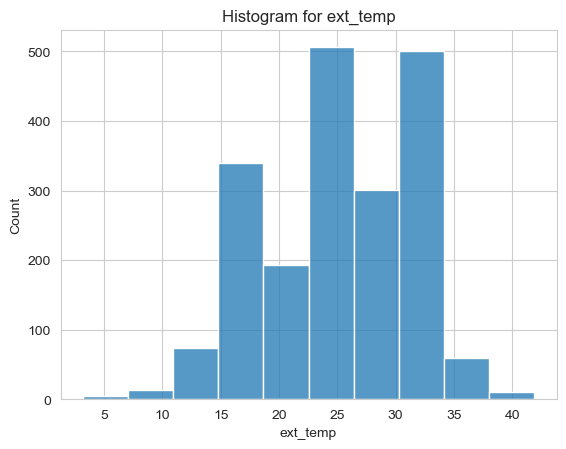

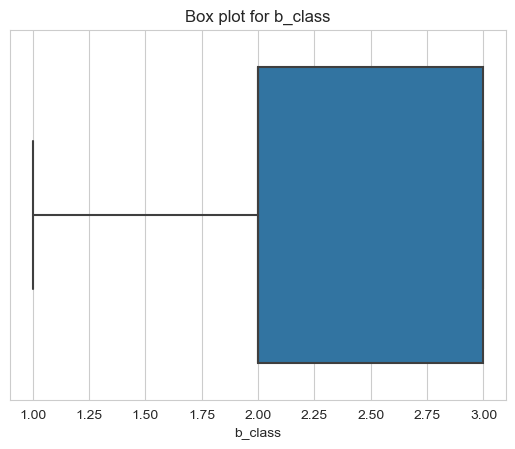

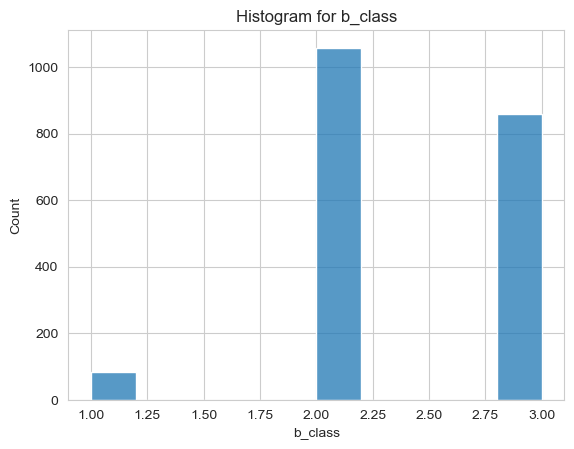

<Figure size 640x480 with 0 Axes>

In [24]:
for col in df.columns:
    # Create a box plot for the column
    plt.figure()
    sns.boxplot(x=df[col])
    plt.title('Box plot for ' + col)
    
    # Create a scatter plot for the column against each other column
#     for col2 in df.columns:
#         if col2 != col:
#             plt.figure()
#             plt.scatter(x=df[col], y=df[col2])
#             plt.xlabel(col)
#             plt.ylabel(col2)
#             plt.title('Scatter plot for ' + col + ' vs ' + col2)
    
    # Create a histogram for the column
    plt.figure()
    sns.histplot(x=df[col], kde=False, bins=10)
    plt.title('Histogram for ' + col)
    
plt.show()

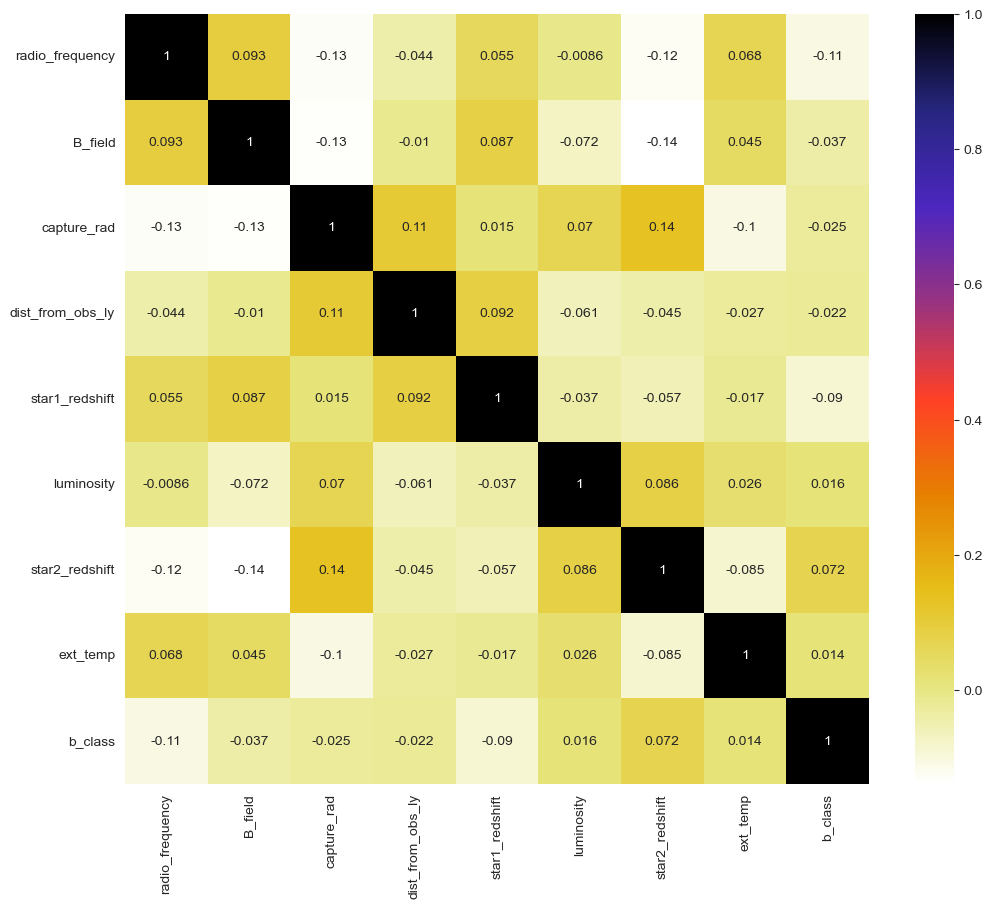

In [108]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [56]:
x=df.iloc[:,:8].values
x

array([[2.87447062e+01, 3.59000000e-09, 1.95924956e+01, ...,
        6.23799359e+03, 3.49398998e+01, 2.55115425e+01],
       [4.41663313e+01, 4.51000000e-09, 4.30046743e+01, ...,
        4.23026638e+03, 2.81810973e+01, 2.60478796e+01],
       [3.08348965e+01, 4.41000000e-09, 3.34299697e+01, ...,
        6.23799359e+03, 2.95776279e+01, 3.07482441e+01],
       ...,
       [4.41663313e+01, 4.45000000e-09, 1.88492640e+01, ...,
        4.52896875e+03, 4.06230176e+01, 2.29138042e+01],
       [3.79977081e+01, 3.64000000e-09, 2.07489433e+01, ...,
        3.83244654e+03, 1.94324549e+01, 2.54807686e+01],
       [3.01583295e+01, 4.45000000e-09, 1.74987357e+01, ...,
        6.23799359e+03, 2.09443711e+01, 3.34924517e+01]])

In [57]:
y=df.iloc[:,-1].values
y

array(['Alpha Boreas', 'Alpha Boreas', 'Beta Eioneous', ...,
       'Alpha Boreas', 'Beta Eioneous', 'Zeta Draconis'], dtype=object)

In [58]:
from sklearn.preprocessing import LabelEncoder
Ly=LabelEncoder()
y=Ly.fit_transform(y)
y


array([0, 0, 2, ..., 0, 2, 4])

In [60]:
from sklearn.model_selection import train_test_split
xtrain , xtest , ytrain,ytest = train_test_split(x,y,test_size=0.1 , random_state=0)

In [61]:
## Hyper Parameter Optimization

params={
 "learning_rate"    : [0.05, 0.10, 0.16 , 0.15, .17 , 0.20, 0.25, 0.30 , 0.40 , 0.41 , 0.45 , 0.50] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15 , 17 , 20 ,30],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 , 0.5 , 0.6 , 0.7 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
    
}

In [62]:
## Hyperparameter optimization using RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import xgboost as xgb

In [63]:
classifier=xgb.XGBClassifier()
random_search=RandomizedSearchCV(classifier,param_distributions=params,n_iter=5,scoring='roc_auc',n_jobs=-1,cv=5,verbose=3)

#xgb_model.fit(xtrain,ytrain)
random_search.fit(xtrain,ytrain)



Fitting 5 folds for each of 5 candidates, totalling 25 fits


C:\Users\Abhinav Krishna\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan]
  warnings.warn(


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           num_parallel_tree=None,
                            

In [65]:
best_pipe=random_search.best_estimator_
best_pipe

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.4, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.4, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.25, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [45]:
#booster = xgb.train(best_pipe.get_xgb_params(), xgb.DMatrix(xtrain, label=ytrain))


XGBoostError: value 0 for Parameter num_class should be greater equal to 1
num_class: Number of output class in the multi-class classification.

In [66]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(classifier,xtest,ytest,cv=10)
score

array([0.85, 0.75, 0.75, 0.75, 0.55, 0.85, 0.35, 0.85, 0.9 , 0.75])

In [67]:
best_pipe.score(xtest, ytest)

0.91

In [68]:
# from sklearn.metrics import confusion_matrix
# conf = confusion_matrix(ytest,ypred)
# conf

NameError: name 'ypred' is not defined

In [163]:
# from sklearn.metrics import accuracy_score as asc
# asc(ytest,ypred)*100

90.5

In [69]:
from xgboost import plot_importance

# plot feature importance
plot_importance(random_search)
plt.show()


ValueError: tree must be Booster, XGBModel or dict instance

In [72]:

del test["ang_class"]
test.head()


,radio_frequency,B_field,capture_rad,dist_from_obs_ly,star1_redshift,luminosity,star2_redshift,ext_temp,b_class
0,13.847038,3.420000e-09,35.892849,42.190316,19.317659,5030.024313,41.062202,16.519720,2
1,17.357120,2.160000e-09,40.926183,29.073718,26.641200,4189.809739,36.989132,30.487612,3
2,45.458139,4.020000e-09,25.771537,15.126236,34.508841,4766.252434,26.678785,29.433535,3
3,13.459710,2.170000e-09,33.077063,41.986773,20.032369,5084.220616,30.830743,31.030701,3
4,27.787212,2.150000e-09,24.157264,41.986773,18.400701,2158.500688,18.289046,31.333728,3


In [73]:
x_test=test.iloc[:,:8].values
y_test=best_pipe.predict(x_test)

In [136]:
y_test

array([1, 1, 3, 1, 4, 0, 3, 0, 0, 4, 2, 1, 4, 3, 3, 1, 2, 2, 4, 2, 4, 3,
       3, 4, 1, 3, 2, 1, 2, 0, 3, 1, 4, 0, 4, 4, 1, 0, 3, 4, 0, 4, 3, 3,
       2, 1, 1, 3, 4, 0, 0, 3, 4, 4, 4, 2, 0, 4, 0, 2, 2, 3, 4, 0, 0, 2,
       0, 0, 0, 3, 1, 2, 2, 3, 0, 3, 4, 0, 4, 3, 3, 1, 3, 3, 0, 1, 4, 1,
       0, 1, 1, 0, 0, 1, 2, 2, 1, 4, 4, 0, 2, 2, 1, 3, 1, 1, 1, 3, 1, 2,
       2, 3, 0, 4, 2, 4, 1, 3, 4, 3, 1, 1, 1, 0, 4, 0, 1, 4, 1, 0, 3, 0,
       1, 3, 2, 0, 0, 1, 1, 1, 1, 1, 2, 3, 3, 2, 3, 4, 0, 3, 2, 3, 3, 1,
       1, 4, 2, 3, 3, 3, 4, 1, 2, 2, 0, 4, 1, 4, 0, 0, 2, 3, 3, 2, 1, 2,
       0, 3, 1, 4, 4, 2, 2, 2, 4, 0, 2, 2, 0, 3, 4, 1, 1, 1, 2, 3, 1, 1,
       2, 3, 3, 2, 4, 0, 3, 0, 3, 1, 2, 3, 0, 2, 2, 2, 1, 4, 3, 4, 3, 2,
       2, 4, 0, 4, 1, 4, 3, 2, 0, 1, 2, 2, 4, 3, 3, 4, 1, 2, 0, 4, 4, 1,
       2, 1, 1, 0, 3, 3, 4, 0, 0, 3, 1, 3, 2, 2, 3, 0, 0, 2, 2, 4, 3, 1,
       1, 3, 4, 2, 1, 3, 0, 0, 2, 0, 3, 0, 0, 1, 1, 2, 4, 0, 0, 2, 2, 2,
       2, 1, 4, 1, 3, 0, 3, 2, 0, 2, 4, 3, 1, 3, 2,

In [74]:
submission = test


In [75]:
submission["target(Black Hole)"]=y_test
submission["target(Black Hole)"] = Ly.inverse_transform(submission["target(Black Hole)"])


In [76]:
submission

,radio_frequency,B_field,capture_rad,dist_from_obs_ly,star1_redshift,luminosity,star2_redshift,ext_temp,b_class,target(Black Hole)
0,13.847038,3.420000e-09,35.892849,42.190316,19.317659,5030.024313,41.062202,16.519720,2,Alpha Hemithea
1,17.357120,2.160000e-09,40.926183,29.073718,26.641200,4189.809739,36.989132,30.487612,3,Alpha Hemithea
2,45.458139,4.020000e-09,25.771537,15.126236,34.508841,4766.252434,26.678785,29.433535,3,Gamma Saggita
3,13.459710,2.170000e-09,33.077063,41.986773,20.032369,5084.220616,30.830743,31.030701,3,Alpha Boreas
4,27.787212,2.150000e-09,24.157264,41.986773,18.400701,2158.500688,18.289046,31.333728,3,Zeta Draconis
...,...,...,...,...,...,...,...,...,...,...
495,30.268835,3.790000e-09,43.004674,23.244364,29.226268,4739.416892,37.990132,23.608112,2,Alpha Boreas
496,38.148344,3.910000e-09,24.950179,41.986773,35.643537,6211.252410,29.525682,33.393150,2,Gamma Saggita
497,34.173976,4.450000e-09,26.422615,20.394055,31.607640,5376.443164,40.623018,27.622435,2,Gamma Saggita
498,33.158077,4.630000e-09,43.004674,33.954285,41.343852,3045.215072,21.629922,16.519720,3,Beta Eioneous


In [77]:
submission.to_csv("submission.csv")